# Clustering of the rock types in a deep well drilled in the Williston Basin: let's keep it data-centric!

An attempt to look into the features, exclude inter-correlated ones and define clusters with Agglomerative clustering and Principal component analysis

### Import dependencies

In [1]:
import pandas as pd
from sklearn.cluster import KMeans
pd.set_option('display.float_format', '{:.2f}'.format)
import numpy as np
import plotly
import plotly.express as px
import lasio
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns
print("Done")

Done


### Create a DataFrame from .las files

In [2]:
# Import .las file into a LASFile object (from lasio package)
las = lasio.read(r"well_log.las")

# Create DataFrame
df = las.df()

# Observe DataFrame
print(df.shape)
df.head()

# same as in the starting notebook: select reasonable and drop the first entries
df = df[df['RHOZ'].between(1.8,3.2)]
df = df[df.index > 2000]


(21543, 55)


# Use correlation matrix to exclude mutually correlated features

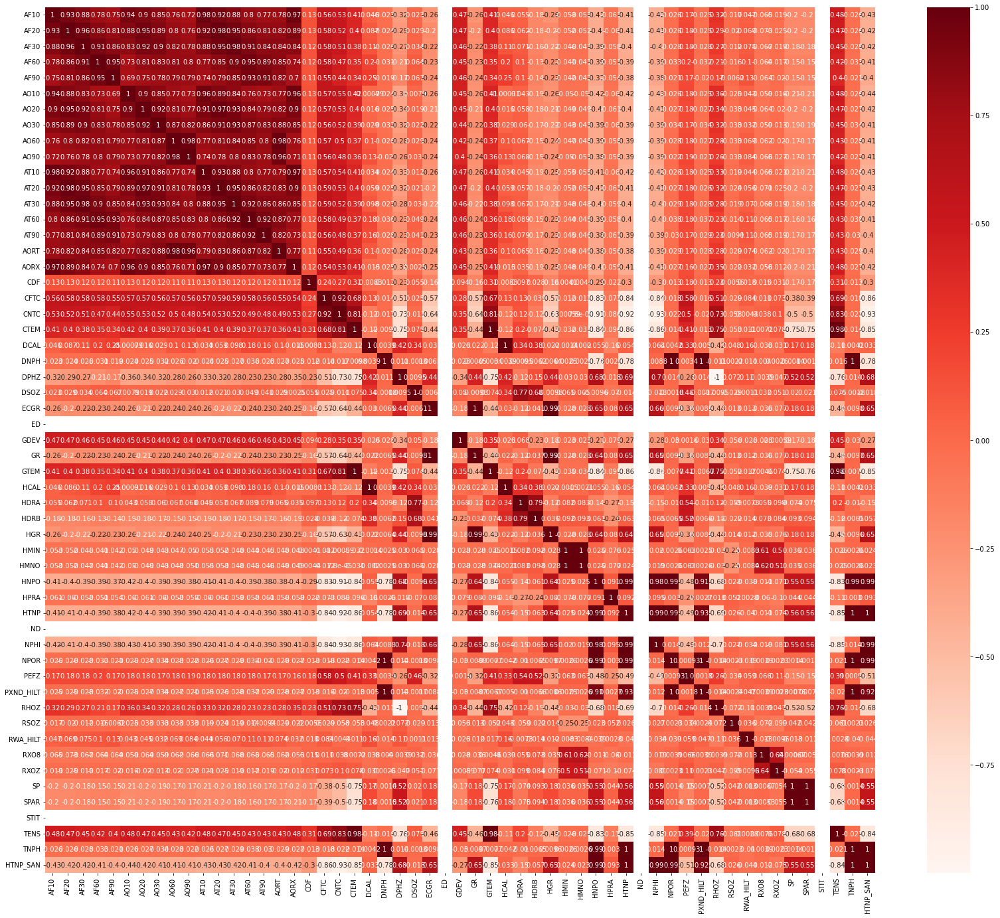

In [3]:
# this monster of a correlation matrix shows that many features are inter-correlated; we will use it to start excluding non-significant variables
plt.figure(figsize=(28,24))
cor = df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

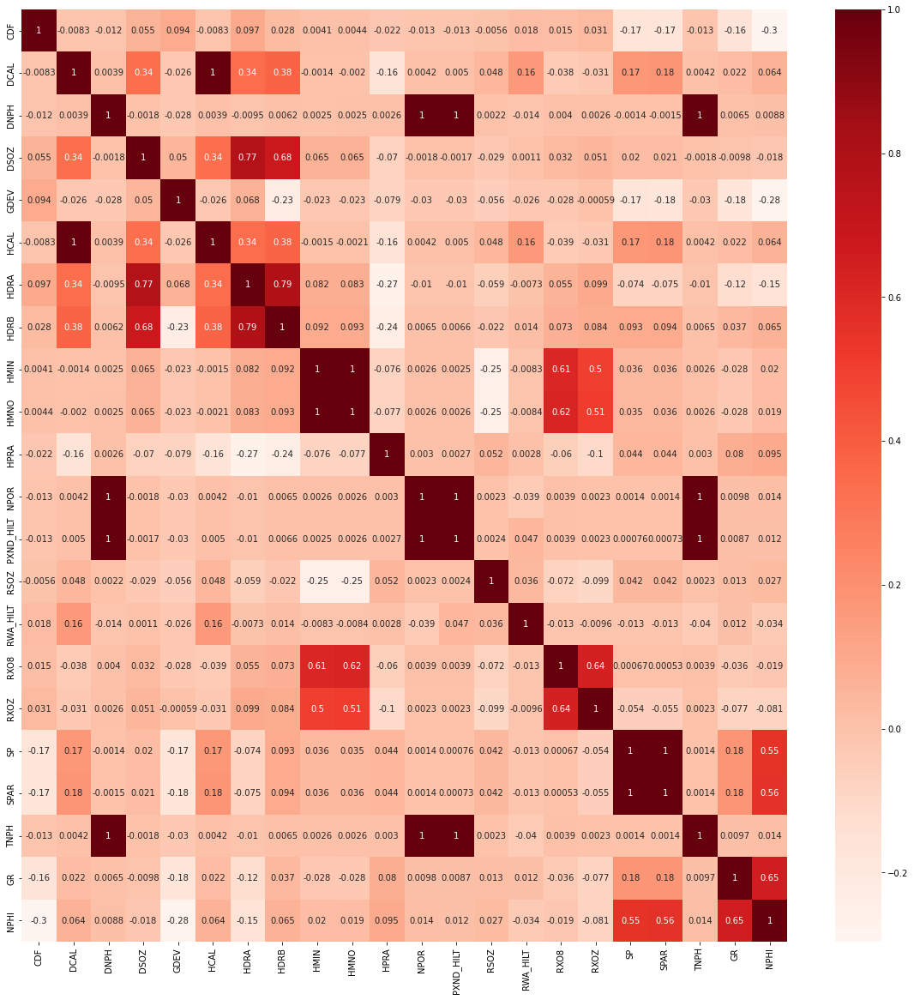

In [4]:
# select those that are not correlated with one of the variables that were defined in the starting notebook, for example GR 
# Correlation with output variable
cor = df.corr()

cor_target1 = abs(cor["GR"])

#Selecting weakly correlated features
relevant_features1 = cor_target1[cor_target1<0.2]
relevant_features1
# plot the correlation matrix for selected relevant features
df_features = relevant_features1.to_frame()
feature_list = list(df_features.index) # make a list of all weakly correlated features
added_features_list = ['GR', 'NPHI'] # add the feature "GR", which we correlated all other features to, and the feature "NPHI" that was in the original list of 3 features, but did not end up in the list of features

df_train = df[feature_list + added_features_list] # a dataframe with selected features   

cor = df_train.corr()
plt.figure(figsize = (20,20))
fig1 = sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [5]:
# looking at the correlation matrix, we see that there are still many inter-correlated variables
# here is the final list of variables (selected by looking at the correlation matrix, finding mutually correlated variables and selecting one out of several correlated ones)
feature_list_for_clustering = [
 'AORT',
 'CDF',
 'GDEV',
 'GTEM',
 'HCAL',
 'HMNO',
 'PXND_HILT',
 'RHOZ',
 'RSOZ',
 'RWA_HILT',
 'RXOZ',
 'SP',
 'TNPH',
 'GR',
 'NPHI']

df_for_clustering = df[feature_list_for_clustering].dropna() # select the variables and drop lines that contain empty cells

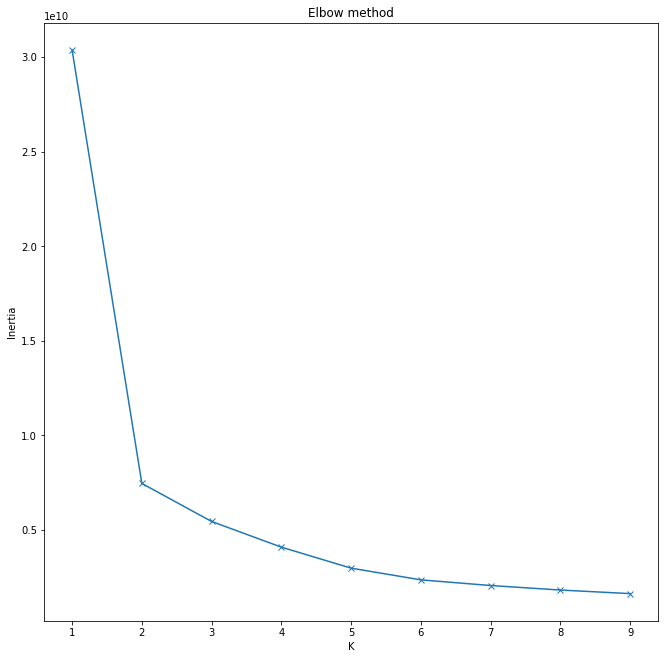

In [6]:
inertias = []
K = range(1,10)
for k in K:
    Model = KMeans(n_clusters=k).fit(df_for_clustering)
    inertias.append(Model.inertia_)
plt.figure(figsize = (11,11))
fig2 = plt.plot(K,inertias,'x-')
plt.xlabel('K')
plt.ylabel('Inertia')
plt.title('Elbow method')
plt.show() 

# from the elbow plot I would choose 6 or 7 clusters

What lithologies are there? 
Three overarching unites: Marine sediments, salt and anhydrite beds, (+secondary dolomitization of limestone). 
Lithologies include mudstone, shale (thin layers of radioactive shales), sandstone, siltstone, and coal. 
Lithologies would be different in their K content (shales contain 2 times more K than sandstones), 
hence Gamma ray would pick up that difference. 
Example of well log shows that limestone with anhydrite would be characterized by the lowest porosity, https://pubs.usgs.gov/pp/1273a/report.pdf 1984 report.

Scale the data

In [7]:
from sklearn.preprocessing import StandardScaler

# Create the scaler and standardize the data
scaler = StandardScaler()
df_for_clustering = pd.DataFrame(scaler.fit_transform(df_for_clustering))

# Create DataFrame
df_for_clustering = pd.DataFrame(df_for_clustering, columns = df_for_clustering.columns, index = df_for_clustering.index)

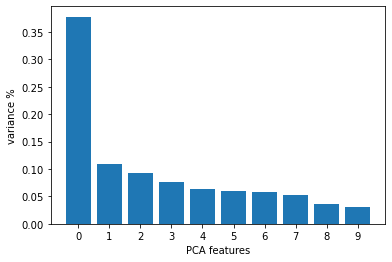

In [8]:
# from the elbow plot we see that it doesn't make a big difference if we use 5, or 6, or 7 clusters

# try the PCA

pca = PCA(n_components=10)
principalComponents = pca.fit_transform(df_for_clustering)
# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_)
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
plt.show() 
# Save components to a DataFrame
PCA_components = pd.DataFrame(principalComponents)

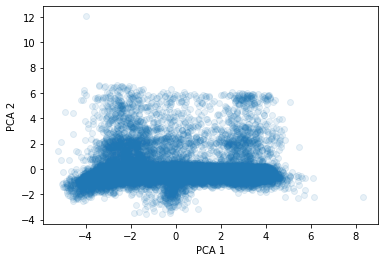

In [9]:
# first five components probably explain it all (70% variance)
# plot the first two
plt.scatter(PCA_components[0], PCA_components[1], alpha=.1)
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show() 
# let's cluster with PCAs: although the pattern is a bit weird, I can see 5-6-7 clusters. 

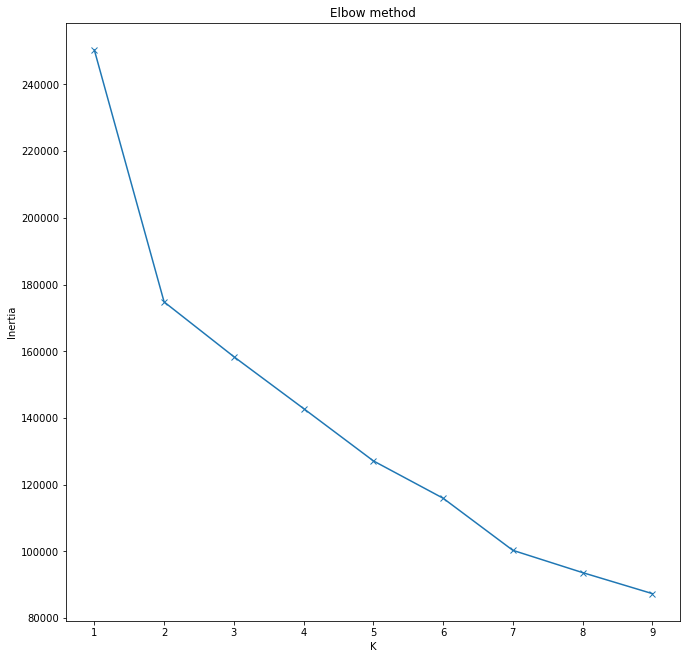

In [10]:
inertias = []
K = range(1,10)
for k in K:
    Model = KMeans(n_clusters=k).fit(PCA_components)
    inertias.append(Model.inertia_)
plt.figure(figsize = (11,11))
fig2 = plt.plot(K,inertias,'x-')
plt.xlabel('K')
plt.ylabel('Inertia')
plt.title('Elbow method')
plt.show()  

Plot the data points in the PCA coordinate space, color by the 1st PCA component

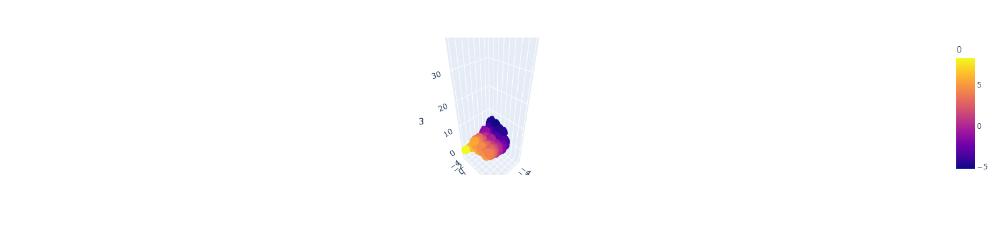

In [11]:
fig = px.scatter_3d(PCA_components, x=0, y=1, z=3,
             color = 0)
fig.show() # distinct groups in the first 4 PCA component space, but it would be nice to color by target variable and see if the clustering is plausible 

Try agglomerative clustering with 7 clusters. 
Actually choosing 7 clusters would be based not only the elbow curve, but also on the knowledge of lithology types,
and would depend on whether the dataset is balanced with regards to rock types are balanced
for example, salt is probably an under-represented lithology, but it is important to pick it whenever it is present, so even if going from 7 clusters to 8 clusters doesn't add much in terms of inertia,
it would be important to include this 8th cluster if it was salt

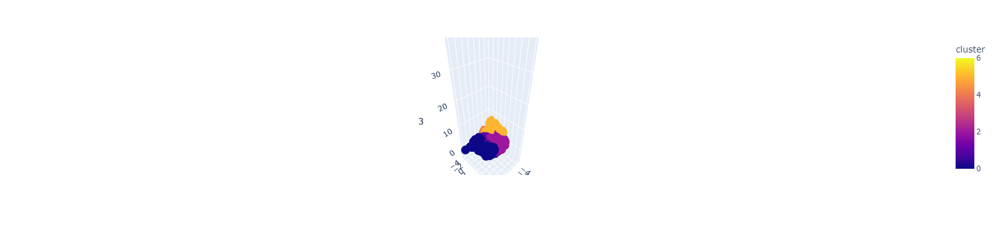

In [12]:
# try with Agglomerative clustering
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
model2 = AgglomerativeClustering(n_clusters = 7)
model2.fit(PCA_components)

# Now append the cluster number from model2 (Agglomerative clustering) to the dataset
PCA_components["cluster"] = model2.fit_predict(PCA_components)
# plot the clusters in coordinates of different PCA components
fig = px.scatter_3d(PCA_components, x=0, y=1, z=3,
             color = 'cluster')
fig.show()

In [13]:
df_for_clustering["cluster"] = PCA_components["cluster"]

In [14]:
outlier = df_for_clustering.loc[df_for_clustering["cluster"] == 3]
outlier.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,cluster
17477,1.14,0.03,3.66,0.45,-0.41,-0.34,-1.35,1.65,-1.53,-125.31,-0.35,0.09,-1.14,-0.86,-1.18,3


Yes, it's just an outlier, we are better off without it

In [15]:
df_for_clustering.drop(df_for_clustering.loc[df_for_clustering["cluster"]==3].index, inplace=True)
PCA_components.drop(PCA_components.loc[PCA_components["cluster"]==3].index, inplace=True)

Plot the 3D PCA plots without the outlier

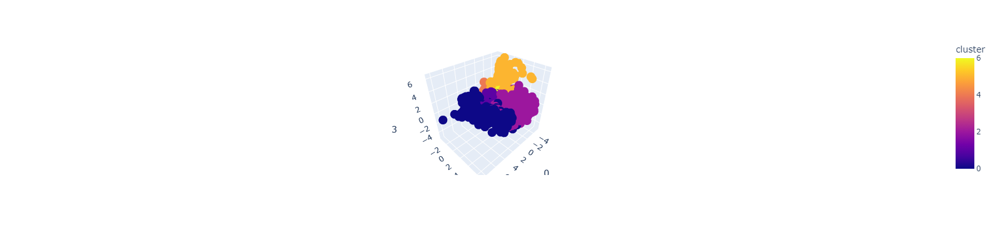

In [16]:
fig = px.scatter_3d(PCA_components, x=0, y=1, z=3,
             color = 'cluster')
fig.show()

# 2D principal component plots

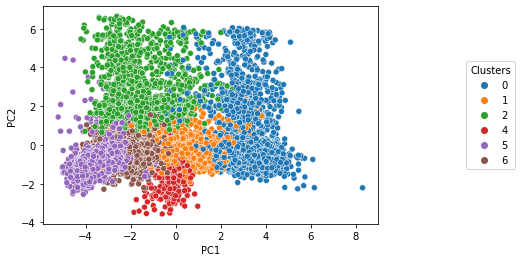

In [17]:
fig = sns.scatterplot(x=0, y=1, data=PCA_components, palette = "tab10", hue='cluster')
plt.xlabel('PC1')
plt.ylabel('PC2')
fig.legend(loc='center left', title = 'Clusters', bbox_to_anchor=(1.25, 0.5), ncol=1)  
# the plot shows separation in PC1-PC2 component space

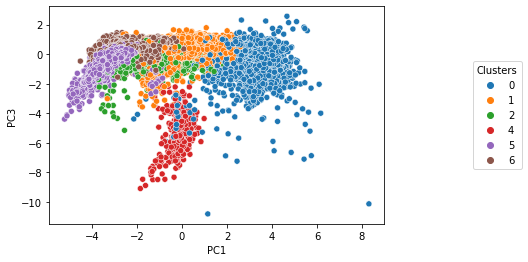

In [18]:
fig3 = sns.scatterplot(x=0, y=2, data=PCA_components, palette = "tab10", hue='cluster')
plt.xlabel('PC1')
plt.ylabel('PC3')
fig3.legend(loc='center left', title = 'Clusters', bbox_to_anchor=(1.25, 0.5), ncol=1) 
# we see that the PC3 does not really add much except it reveals the 6th cluster (brown, not visible on RC1/PC2 plot)

Conclusion: understanding the lithology is key to being able to define clusters. 